In [1]:
import numpy as np
from scipy.io import loadmat, savemat
import os
from math import tan, radians, sqrt, atan, pi, cos, sin
from utils.visualizations import *
import matplotlib.pyplot as plt
from copy import deepcopy
from scipy.signal import find_peaks

In [2]:
run_mirror_scene = False

In [3]:
# === Set thresholds for reciprocal pair constraints === #
pk_match_thresh = 30E-12 # set threshold for peak match constraint
path_diff_thresh = 30E-12 # set threshold for path diff match constraint

# === Data directory === #
if run_mirror_scene:
    exp_name = '/u/sidsoma/mirror_scanning_iccp24/experiments/mirror_test_32x32'
else:
    exp_name = '/u/sidsoma/mirror_scanning_iccp24/experiments/diffuse_patch_test'

# === Other parameters === #
c = 3E8 # speed of light

Text(0.5, 1.0, 'Projector Pattern')

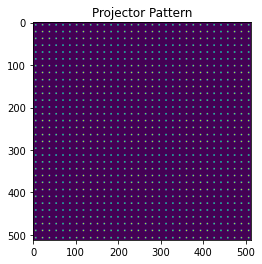

In [4]:
camera_params = np.load(os.path.join(exp_name, 'params.npz'))
camera_params = {k: camera_params[k] for k in camera_params.keys()}

# === Load projector parameters === #
pixel_coords = camera_params['pixel_coords'] # in homogeneous coordinates
spot_hw = int(camera_params['spot_hw'])

# === Load Extrinsic parameters === #
camera_pos = camera_params['cam_pos']
look_at = camera_params['look_pos']
up_dir = camera_params['up_dir']

# === Load Intrinsic parameters === #
fov = float(camera_params['fov']) # in degrees
x_res = int(camera_params['x_res']) # NOTE: CODE WILL ONLY WORK IF X_RES = Y_RES
y_res = int(camera_params['y_res'])

# === Load histogram parameters === #
hists_full = np.load(os.path.join(exp_name, 'output.npz'))
hists_full = hists_full['I']
hists_full = hists_full[:, :, 0, :] # only use R channel out of RGB

numBins = hists_full.shape[-1]
tMin = camera_params['tMin'] / c
tMax = camera_params['tMax'] / c
tRes = camera_params['tRes'] / c

if run_mirror_scene: 
    num_x_spots = 32
    num_y_spots = 32
else:
    num_x_spots = camera_params['num_x_spots']
    num_y_spots = camera_params['num_y_spots']
numSpots = num_x_spots * num_y_spots

# === Adjust pixel coordinates so that x = right (1, x_res), y = up (1, y_res) === #
pixel_coords_idx = deepcopy(pixel_coords)
# y axis is flipped because row indexing goes top --> bottom, pixel goes bottom --> top
pixel_coords_idx[:, 1] = y_res - pixel_coords_idx[:, 1] 
# x axis is flipped because column indexing goes right --> left in our coordinate frame
pixel_coords_idx[:, 0] = x_res - pixel_coords_idx[:, 0]

plt.imshow(camera_params['proj_img']); plt.title('Projector Pattern')

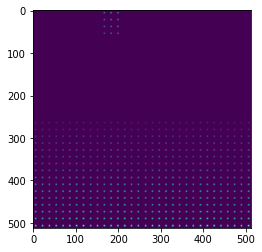

In [5]:
plt.imshow(np.sum(hists_full, axis=-1))

Text(0.5, 1.0, 'Pixel Integration Width')

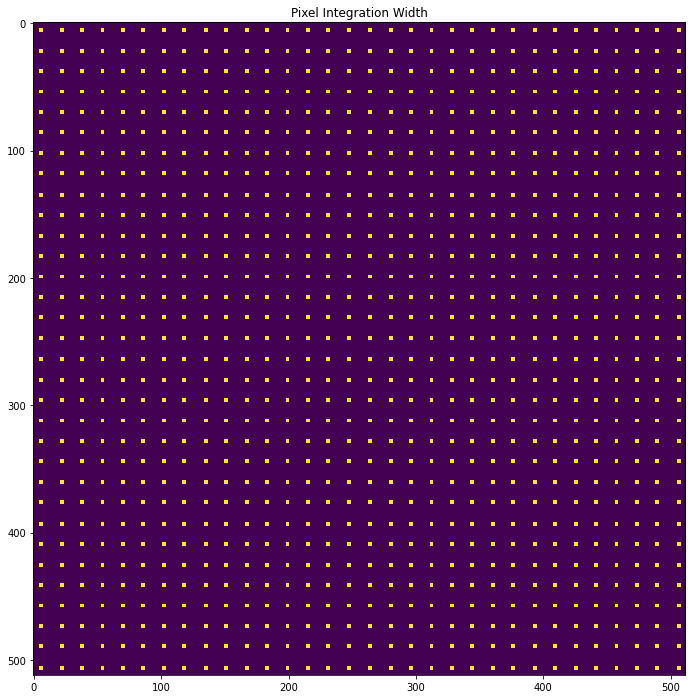

In [6]:
# === Increase pixel size by integrating histograms over neighboring pixels === #
hists = np.zeros((numSpots, numBins))
hists_test = np.zeros((numSpots, numBins))
int_proj_image = np.zeros((y_res, x_res))
tofs = np.argmax(hists_full, axis=-1)
int_width = 1
for i in range(numSpots):
    idx_x = int(pixel_coords[i, 0]); idx_y = int(pixel_coords[i, 1])
    # determine range of pixels to integrate over 
    idx_1 = max(idx_y-int_width, 0); idx_2 = min(idx_y+int_width+1, y_res)
    idx_3 = max(idx_x-int_width, 0); idx_4 = min(idx_x+int_width+1, x_res)
    # integrate histogram over neighboring pixels
    transient = np.zeros((numBins, ))
    for y_idx in range(idx_1, idx_2):
        for x_idx in range(idx_3, idx_4):
            tof = tofs[y_idx, x_idx]
            transient[tof] = transient[tof] + hists_full[y_idx, x_idx, tof]
    hists_test[i] = np.sum(hists_full[idx_1:idx_2, idx_3:idx_4], axis=(0, 1))
    hists[i] = transient
    int_proj_image[idx_1:idx_2, idx_3:idx_4] = 1

plt.figure(figsize=(12, 12))
plt.imshow(int_proj_image, interpolation='none'); plt.title('Pixel Integration Width')

/tmp/ipykernel_1968495/746101289.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


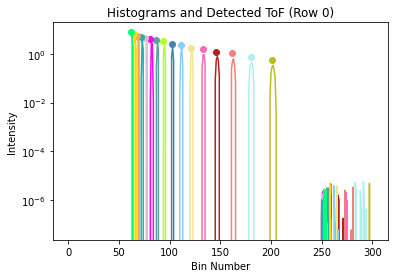

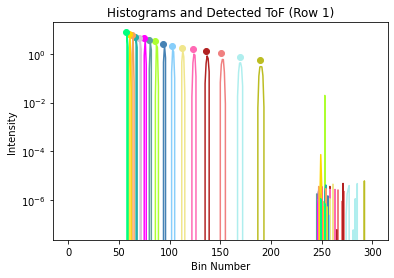

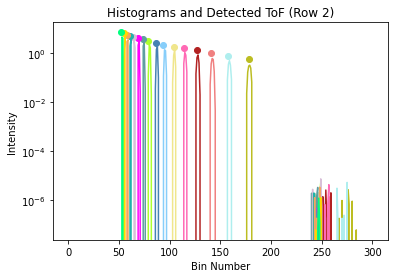

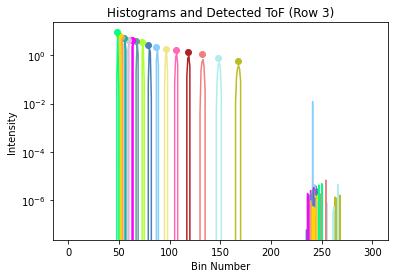

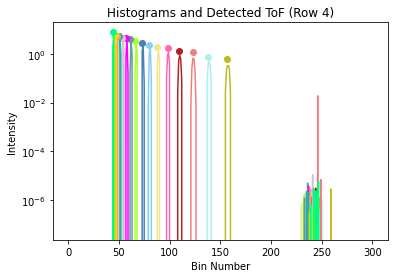

...

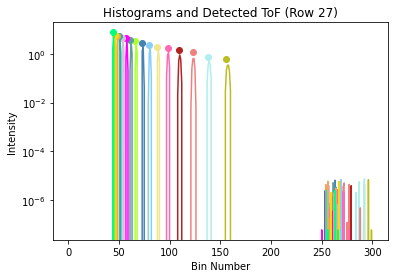

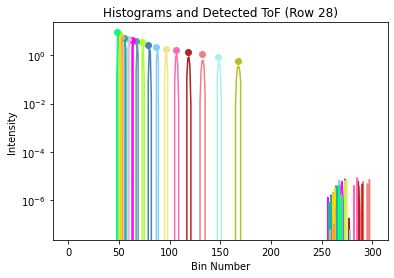

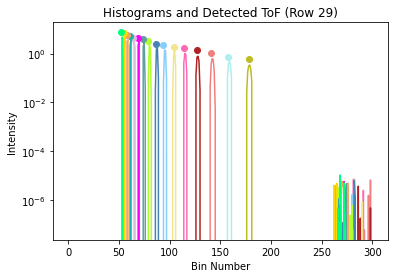

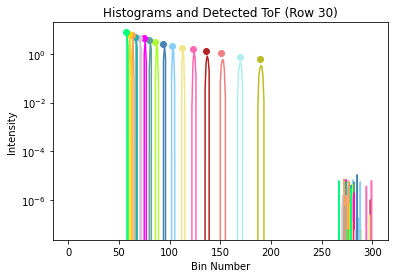

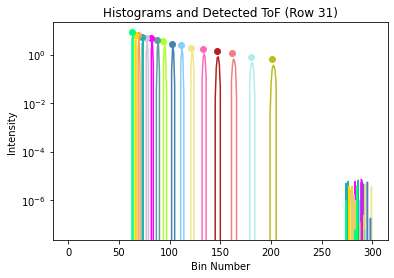

In [7]:
# === Extract echo 1 and echo 2 from histograms === #
def gaussian_kernel(size, sigma):
    kernel = np.arange(size) - (size - 1) / 2
    kernel = np.exp(-kernel ** 2 / (2 * sigma ** 2))
    # kernel = kernel / np.sum(kernel)
    roll_num = (size-1)//2 #- 3*sigma
    kernel = np.roll(kernel, roll_num)
    return kernel

def convolve_with_gaussian(signal_1D):
    numBins = signal_1D.shape[0]
    gaussian = gaussian_kernel(numBins, 10)
    # result = np.convolve(signal_1D, gaussian, mode="same")
    result = np.abs(np.fft.ifft(np.fft.fft(signal_1D) * np.fft.fft(gaussian)))
    result = (result > 1E-8) * result
    return result

#### CHECK PLOTS TO MAKE SURE THAT ECHOS ARE IN CORRECT LOCATION === #
def extract_echos(hists, tMin, tRes):
    # This function turns camera position / look at direction to extrinsic matrix
    # =========== INPUTS =========== #
    # histograms (N, T) --> N pixels, T timing bins
    # =========== OUTPUTS ========== #
    # echo 1 --> (N, 1), echo 2 --> (N, 1)

    numPixels = hists.shape[0]
    echo1 = np.zeros((numPixels, 1)); echo1[:] = np.nan
    echo2 = np.zeros((numPixels, 1)); echo2[:] = np.nan
    
    # === Extract per-pixel peaks === #
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'tab:orange', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:grey', 'tab:blue',
                    'tab:green', 'tab:red', 'tab:cyan', 'tab:olive', 'paleturquoise', 'lightcoral', 'firebrick', 'hotpink', 
                    'khaki', 'lightskyblue', 'steelblue', 'greenyellow', 'cadetblue', 'magenta', 'thistle', 'lightseagreen',
                    'sandybrown', 'gold', 'springgreen']
    k = 0
    for i in range(num_y_spots): # loop through every column
        plt.figure()
        plt.xlabel('Bin Number')
        plt.ylabel('Intensity')
        for j in range(num_x_spots): # loop through every row
            signal = convolve_with_gaussian(hists[k])
            # signal = hists[k]
            peaks, _ = find_peaks(signal)
            # === Extract echo 1 and echo 2 (if available) === #
            if peaks.shape[0] == 1:
                echo1[k] = tMin + tRes * peaks[0]
                if peaks[0] > numBins-1 or peaks[0] < 0:
                    print(peaks[0])

            elif peaks.shape[0] >= 2: 
                echo1[k] = tMin + tRes * peaks[0]
                echo2[k] = tMin + tRes * peaks[1]
                if peaks[0] > numBins-1 or peaks[0] < 0:
                    print(peaks[0])


            # === Plot histograms and echos === #
            # plt.semilogy(hists[k, :], color=colors[j])
            # plt.semilogy(signal, color=colors[j])
            plt.semilogy(hists_test[k, :], color=colors[j])
            plt.title(f'Histograms and Detected ToF (Row {i})')
            for p in peaks: # loop through every peak and plot
                plt.plot(p, signal[p], marker='o', color=colors[j])
                
            k += 1

    # print(peaks)
    # echo1 = tMin + np.argmax(hists, axis=-1) * tRes
    # echo2 = echo1

    return echo1, echo2

echo_1, echo_2 = extract_echos(hists, tMin, tRes)

In [8]:
# test = gaussian_kernel(numBins, 5)
# # plt.plot(test)
# idx = 140
# plt.plot(hists[idx, :])
# plt.plot(convolve_with_gaussian(hists[idx, :]))

In [9]:
# import hdf5storage
# hdf5storage.savemat('hists_full.mat', {'hist': hists_full.astype(float)}, format=7.3, matlab_compatible=True, compress=False )

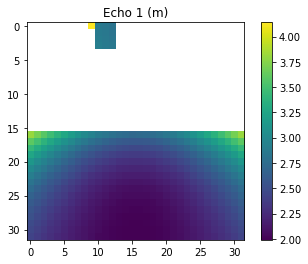

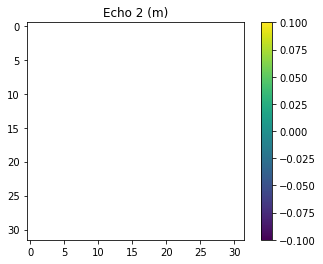

In [10]:
# === Visualize echo 1 and echo 2 === #
plt.figure(); plt.imshow(c*echo_1.reshape(num_y_spots, num_x_spots).T, interpolation='none'); plt.title('Echo 1 (m)'); plt.colorbar()
plt.figure(); plt.imshow(c*echo_2.reshape(num_y_spots, num_x_spots).T, interpolation='none'); plt.title('Echo 2 (m)'); plt.colorbar()

In [11]:
def extract_extrinsic_matrix(C, p, u):
    # This function turns camera position / look at direction to extrinsic matrix
    # Based on pseudo code from https://ksimek.github.io/2012/08/22/extrinsic/
    # =========== INPUTS =========== #
    # C = origin / camera center
    # p = look at point / target
    # u = up direction 
    # =========== OUTPUTS ========== #
    # camera matrix

    # Calculate the forward vector (the direction we're looking)
    forward = (p - C) / np.linalg.norm(p - C)

    # Calculate the right vector (perpendicular to the forward and up vectors)
    left = np.cross(u, forward)
    left = left / np.linalg.norm(left)

    # Calculate the up vector (perpendicular to the forward and right vectors)
    up = np.cross(forward, left)

    # Construct the rotation matrix
    cam2world = np.hstack([left.reshape(3, 1), up.reshape(3, 1), forward.reshape(3, 1), C.reshape(3, 1)])
    cam2world = np.vstack([cam2world, np.array([[0, 0, 0, 1]])])

    return cam2world

def extract_intrinsic_matrix(x_res, y_res, fov):
    c_x = int(x_res/2) # in pixels
    c_y = int(y_res/2) # in pixels

    # === compute focal length === #
    f_x = x_res / (2*tan(radians(fov/2)))
    f_y = f_x

    intrinsic_matrix = np.array([[f_x,  0 , c_x, 0],
                                 [ 0 , f_y, c_y, 0],
                                 [ 0 ,  0 ,  1 , 0]])

    return intrinsic_matrix


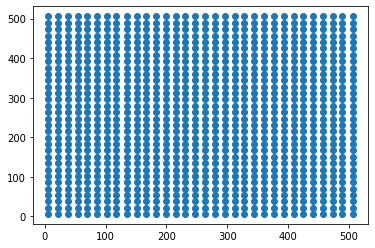

In [12]:
# === Extract camera matrices === #
cam2world = extract_extrinsic_matrix(camera_pos, look_at, up_dir) # (4, 4) matrix ##### DOUBLE CHECK THIS FUNCTION
intrinsic_matrix = extract_intrinsic_matrix(x_res, y_res, fov) # (3, 3) matrix

# === Compute ray directions === #
ray_cam_coords = np.linalg.inv(intrinsic_matrix[:, 0:3]) @ (pixel_coords_idx).T # (3, 3) * (3, numSpots) matrix
ray_cam_coords_hom = np.vstack([ray_cam_coords, np.ones((1, pixel_coords.shape[0]))]) # (4, numSpots) matrix

ray_dirs = cam2world @ ray_cam_coords_hom # (4, 144) matrix
ray_dirs = ray_dirs[0:3, :] / np.linalg.norm(ray_dirs[0:3, :], axis=0) # (3, numSpots) matrix
ray_dirs = ray_dirs.T # (numSpots, 3) matrix

# === Visualize rays (for debugging) === #
debug_rays = True
if debug_rays:
    rays_vis = create_ray_visualizer(ray_dirs)
    plot_rays_walls(rays_vis)
    plt.plot(pixel_coords[:, 0], pixel_coords[:, 1], 'o')

In [13]:
# === Estimate point cloud from echos and camera rays (debug for sanity check) === # 
debug_points = True
if debug_points:
    pt_cloud = ray_dirs * (c * echo_1 / 2)
    plot_point_cloud([pt_cloud], camera_pos)

    # sanity check 
    wall_distance = 1
    floor_height = -1
    print("NOTE: These values assume that the camera is perpendicular to the wall.")
    print("Measured Wall Width: ", np.nanmax(pt_cloud[:, 0]) - np.nanmin(pt_cloud[:, 0]))
    print("Expected Wall Width: ", 2 * tan(radians(fov/2)))

    print("Measured Wall Distance: ", np.nanmean(pt_cloud[:, 2]))
    print("Expected Wall Distance: ", wall_distance)

    print("Measured Floor Height: ", np.nanmean(pt_cloud[:, 1]))
    print("Expected Floor Height: ", floor_height)

    # savemat('simulated_32x32.mat', {'echo1': echo_1, 'echo2': echo_2, 'pt_cloud': pt_cloud})


NOTE: These values assume that the camera is perpendicular to the wall.
Measured Wall Width:  2.661279076531624
Expected Wall Width:  1.9999999999999998
Measured Wall Distance:  0.40811226259055533
Expected Wall Distance:  1
Measured Floor Height:  -0.9704818468424455
Expected Floor Height:  -1


In [14]:
class Ellipse:
    def __init__(self, tof, x_illum, camera_params):
        """
        INPUTS:
            tof = total 2B tof
            x_c = camera_location (focus 1)
            x_illum = laser illumination point (focus 2)
            camera_params = camera/laser location
        """
        # === Ellipse Parameters === #
        # Focus vectors and length
        self.f_1 = camera_params.x_c # focus 1
        self.f_2 = x_illum # focus 2
        self.f_vec = (self.f_2 - self.f_1) / 2
        self.f = np.linalg.norm(self.f_vec) # focus length

        # Major and Minor axis
        self.a = (c*tof - np.linalg.norm(x_illum - camera_params.x_l)) / 2 # major axis
        self.skip = True
        if self.a**2 - self.f**2 > 0:
            self.b = sqrt(self.a**2 - self.f**2) # minor axis

            # === Compute Transformations Parameters === #
            self.center = (self.f_1 + self.f_2) / 2
            self.t_xz = atan(abs(self.f_vec[2] / self.f_vec[0])) # NOTE: Assumes z > 0
            if self.f_vec[0] < 0:
                self.t_xz = pi - self.t_xz
            new_x_mag = np.linalg.norm([self.f_vec[0], self.f_vec[2]])
            self.t_xy = -atan(self.f_vec[1] / new_x_mag)

            # === Compute Unit Sphere Transformation Matrix === #
            # Rotation matrices
            rot_xz = np.array([[cos(self.t_xz) , 0, sin(self.t_xz)],
                               [      0        , 1,        0      ],
                               [-sin(self.t_xz), 0, cos(self.t_xz)]])
            rot_xy = np.array([[cos(self.t_xy), -sin(self.t_xy), 0],
                               [sin(self.t_xy),  cos(self.t_xy), 0],
                               [       0      ,        0       , 1]])

            # Scaling matrix
            scale_matrix = np.array([[(1/self.a),      0    ,     0     ],
                                     [  0       , (1/self.b),     0     ],
                                     [  0       ,      0    , (1/self.b)]])
            self.T = scale_matrix @ rot_xy @ rot_xz
            self.skip = False
    
    def compute_ray_ellipse_intersection(self, ray):
            if abs(np.linalg.norm(ray) - 1.0) > 1E-5:
                raise AssertionError("Input rays should be normalized to unit length")
            rho = self.compute_rho(ray)
            return rho * ray

    def compute_rho(self, x_dir):
        m1 = self.T @ x_dir
        m2 = self.T @ self.center
        a = np.linalg.norm(m1)**2
        b = -2*np.dot(m1, m2)
        c = np.linalg.norm(m2)**2 - 1
        return (-b + sqrt(b**2-4*a*c)) / (2*a) 
class Camera:
    def __init__(self, x_c, x_l):
        self.x_c = x_c
        self.x_l = x_l

/tmp/ipykernel_1968495/3205719878.py:14: RuntimeWarning:

All-NaN slice encountered

/tmp/ipykernel_1968495/3205719878.py:28: RuntimeWarning:

All-NaN slice encountered



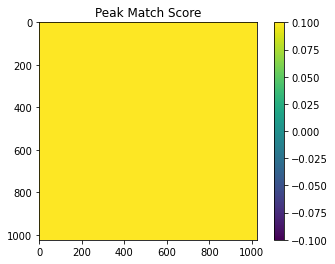

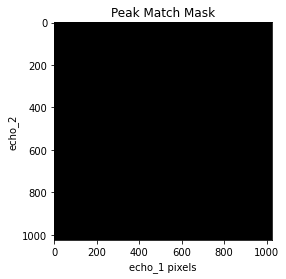

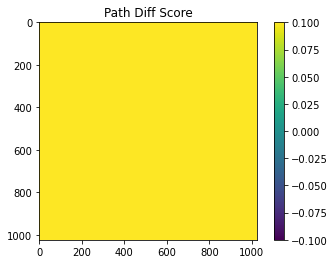

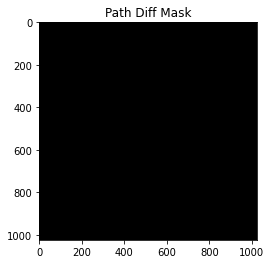

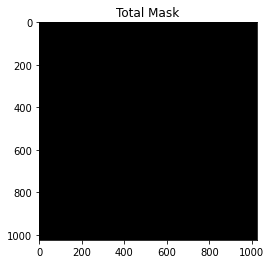

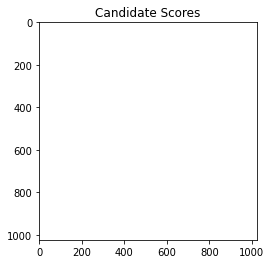

In [15]:
# =================== STEP 1: IDENTIFY RECIPROCAL PAIRS =================== #
def detect_reciprocal_pairs(echo_1, echo_2):

    ########################### INPUTS ###########################
    # echo_1 : (numSpots x 1) vector of per-pixel time-of-flight of first echo [seconds]
    # echo_2 : (numSpots x 1) vector of per-pixel time-of-flight of second echo [seconds]

    ########################### OUTPUT ###########################
    # reciprocal_pairs : (K x 2) array of reciprocal indices
    #     * Kth row contains the indices of the two pixels that are reciprocal pairs

    # === Check peak match constraint === #
    pk_match_test = np.abs(echo_2 - echo_1.T)
    pk_match_max = np.nanmax(pk_match_test)
    pk_match_test = np.nan_to_num(pk_match_test, nan=10000)
    plt.imshow(pk_match_test, interpolation='none'); 
    plt.clim([0, pk_match_max]); plt.colorbar(); plt.title('Peak Match Score')
    # pk_match_mask = (np.abs(pk_match_test) < 100E-12)
    pk_match_mask = (np.abs(pk_match_test) < 2*pk_match_thresh)
    plt.figure(); 
    # plt.imshow(pk_match_test, interpolation='none')
    plt.imshow(pk_match_mask, cmap='gray', interpolation='none')
    plt.title('Peak Match Mask'); plt.ylabel('echo_2'); plt.xlabel('echo_1 pixels')

    # === Check path diff match constraint === #
    echo_diff = echo_2 - echo_1
    path_diff_test = np.abs(echo_diff - echo_diff.T)
    path_diff_max = np.nanmax(path_diff_test)
    path_diff_test = np.nan_to_num(path_diff_test, nan=10000)
    path_diff_mask = (path_diff_test < 2*path_diff_thresh)
    # path_diff_mask = (path_diff_test < 100E-12)
    plt.figure()
    plt.imshow(path_diff_test, interpolation='none'); 
    plt.clim([0, path_diff_max]); plt.colorbar(); plt.title('Path Diff Score')

    plt.figure(); 
    # plt.imshow(path_diff_test, interpolation='none')
    plt.imshow(path_diff_mask, cmap='gray', interpolation='none')
    plt.title('Path Diff Mask')

    # === Combine two constraints === #
    total_mask = pk_match_mask * path_diff_mask
    plt.figure(); 
    plt.imshow(total_mask, cmap='gray', interpolation='none')
    plt.title('Total Mask')

    # === Remove multiple redundant candidate pairs === #
    intensities = np.max(hists, axis=-1)
    candidate_scores = pk_match_test * path_diff_test 
    # set masked pixels to be infinity
    remove_candidates = np.where(1-total_mask) 
    candidate_scores[remove_candidates] = np.inf
    plt.figure(); 
    plt.imshow(candidate_scores, cmap='hot', interpolation='none')
    plt.title('Candidate Scores')

    # find min only along qualified points 
    reciprocal_pairs = []
    for i in range(numSpots):
        if np.sum(total_mask[i, :]) == 0:
            continue
        idx = np.argmin(candidate_scores[i, :])
        reciprocal_pairs.append(np.array([i, idx]))

        plt.figure()
        plt.semilogy(hists[i])
        plt.semilogy(hists[idx])

    # reciprocal_pairs = np.nonzero(total_mask)
    reciprocal_pairs = np.array(reciprocal_pairs)
    # reciprocal_pairs = reciprocal_pairs.T

    return reciprocal_pairs

reciprocal_pairs = detect_reciprocal_pairs(echo_1, echo_2)


In [16]:
reciprocal_pairs.shape

(0,)

Diffuse points are blue, specular points are green


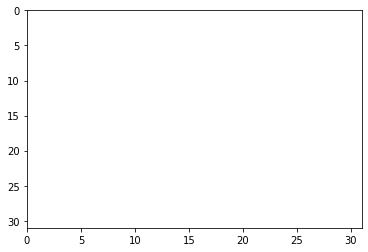

In [17]:
# =================== STEP 2: RECONSTRUCTION FROM RECIPROCAL PAIRS =================== #
num_pairs = reciprocal_pairs.shape[0]
diffuse_pt_cloud = np.zeros((num_pairs, 3))
specular_pt_cloud = np.zeros((num_pairs, 3))
plt.figure()
plt.xlim([0, num_x_spots-1])
plt.ylim([0, num_y_spots-1])
plt.gca().invert_yaxis()

for i in range(num_pairs):
    pixel_A = reciprocal_pairs[i][0]
    pixel_B = reciprocal_pairs[i][1]

    # === Determine which pixel is specular and diffuse === #
    if echo_1[pixel_A] > echo_1[pixel_B]:
        diffuse_pt = pixel_A
        specular_pt = pixel_B
    else:
        diffuse_pt = pixel_B
        specular_pt = pixel_A

    diffuse_pt_vec = np.unravel_index(diffuse_pt, (num_y_spots, num_x_spots))
    specular_pt_vec = np.unravel_index(specular_pt, (num_y_spots, num_x_spots))
    print("Diffuse Point: ", diffuse_pt_vec)
    print("Specular Point: ", specular_pt_vec)

    plt.plot(diffuse_pt_vec[0], num_y_spots-diffuse_pt_vec[1], 'ob')
    plt.plot(specular_pt_vec[0], num_y_spots-specular_pt_vec[1], 'og')

    # === Locate diffuse point === #
    diffuse_x = c * (echo_1[diffuse_pt] / 2) * ray_dirs[diffuse_pt] # first return from specular pt is 1-bounce
    diffuse_pt_cloud[i] = diffuse_x

    # === Locate specular point === #
    cam_pos_params = Camera(camera_pos, camera_pos)
    ellipse_data = Ellipse(echo_2[specular_pt], diffuse_x, cam_pos_params) # first return from specular pt is 2-bounce
    if ellipse_data.skip:
        continue
    specular_pt_cloud[i] = ellipse_data.compute_ray_ellipse_intersection(ray_dirs[specular_pt])
print("Diffuse points are blue, specular points are green")

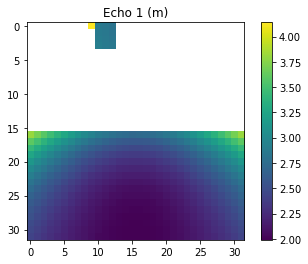

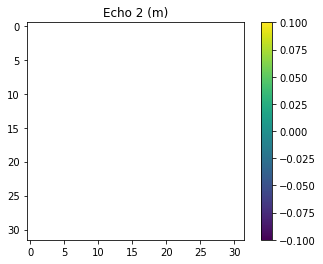

In [18]:
# === Visualize echo 1 and echo 2 === #
plt.figure(); plt.imshow(c*echo_1.reshape(num_y_spots, num_x_spots).T, interpolation='none'); plt.title('Echo 1 (m)'); plt.colorbar()
plt.figure(); plt.imshow(c*echo_2.reshape(num_y_spots, num_x_spots).T, interpolation='none'); plt.title('Echo 2 (m)'); plt.colorbar()

In [19]:
plot_point_cloud([diffuse_pt_cloud, specular_pt_cloud], camera_pos)

In [20]:
diffuse_pt_cloud

array([], shape=(0, 3), dtype=float64)

In [21]:
specular_pt_cloud

array([], shape=(0, 3), dtype=float64)